In [1]:
import scipy
from scipy.special import digamma
import numpy as np
import matplotlib.pyplot as plt
import torch
import numpyro
import jax

In [2]:
def delta_e_xent(a,b,p):
    grad = (a*scipy.special.polygamma(1,a+b) - a*p*scipy.special.polygamma(1,a)), (b*scipy.special.polygamma(1,a+b)-(1-p)*b*scipy.special.polygamma(1,b))
    val = -p*scipy.special.digamma(a) - (1-p)*scipy.special.digamma(b) + scipy.special.digamma(a+b) + p*np.log(p) + (1-p)*np.log(1-p)
    kl = -p*np.log(a/(a+b))-(1-p)*np.log(1-a/(a+b)) + p*np.log(p) +(1-p)*np.log(1-p)
    return grad, val, kl

In [69]:
sum(delta_e_xent(1,1000,.9)[0])

-0.5799910099967673

In [70]:
delta_np_xent(1001, 1/1001, .9, 1)

((-0.5799910099967676, -0.999001996007984),
 6.411940801103863,
 5.8928962780255585)

In [71]:
def delta_np_xent(n, p_hat, target_p, w):
    a, b = n*p_hat, n*(1-p_hat)
    h = target_p*np.log(target_p) + (1-target_p)*np.log(1-target_p)
    grad = -target_p*scipy.special.polygamma(1,a)*a - (1-target_p)*scipy.special.polygamma(1,b)*b + scipy.special.polygamma(1,n)*n , (p_hat-w)/((n+1)*p_hat*(1-p_hat)) #-target_p*scipy.special.polygamma(1,a)*n + (1-target_p)*scipy.special.polygamma(1,b)*n 
    val = -target_p*scipy.special.digamma(a) - (1-target_p)*scipy.special.digamma(b) + scipy.special.digamma(a+b) + h
    kl = -target_p*np.log(a/(a+b))-(1-target_p)*np.log(1-a/(a+b)) + h
    return grad, val, kl

In [8]:
def x_ent_loss(p_hat, n, target_p):
    return -target_p*scipy.special.digamma(p_hat*n)-(1-target_p)*scipy.special.digamma((1-p_hat)*n)+scipy.special.digamma(n)

In [436]:
def lifetime_loss(a,b,a_0,b_0):
    return a_0/(2*(a_0+b_0))*np.log(a)+a*np.log(a)+a*(digamma(a_0+b_0)-digamma(a_0))+b_0/(2*(a_0+b_0))*np.log(b)+b*np.log(b)+b*(digamma(a_0+b_0)-digamma(b_0))-scipy.special.loggamma(a+b+1)

In [533]:
def expected_log_approx(a,n,p):
    return np.log(a+n*p)-n*p*(1-p)/(2*(a+n*p)**2)
    # return np.log(n*p+a)-(1-p)/(2*p*n)

In [534]:
def bin_x_ent(a,b,n,p):
    return np.log(a+b+n)-p*expected_log_approx(a,n,p) - (1-p)*expected_log_approx(b,n,1-p)

In [535]:
a=5
b=10
n=1
p=.7
bin_x_ent(a,b,n,p)

0.8571783835258306

In [516]:
random_values = np.random.binomial(n,p,100000)

In [532]:
np.log(a+b+n)-p*np.log(a+random_values).mean() -(1-p)*np.log(b+n-random_values).mean()

0.6783981610997665

In [520]:
np.log(a+b+n)

2.995732273553991

In [488]:
scipy.stats.binom.rv(10,.9,10)

AttributeError: 'binom_gen' object has no attribute 'rv'

In [441]:
lifetime_loss(4,4,1,1)

9.17889916677382

In [481]:
dim = 100
arr = np.zeros((dim,dim))
for i in range(1,dim+1):
    for j in range(1,dim+1):
        a=i
        b=j
        # a = np.arange(1,101)
        # b = np.arange(1,101)
        a_0=90
        b_0=10
        arr[i-1,j-1]=lifetime_loss(a,b,a_0,b_0)

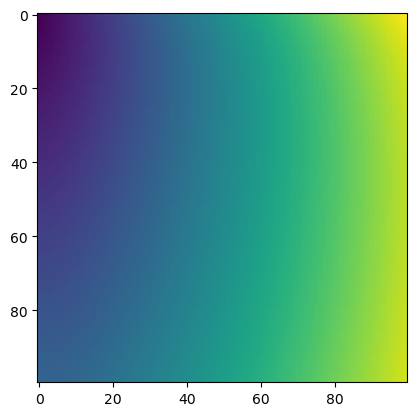

In [482]:
plt.imshow(arr)

In [74]:
def delta_lifetime_loss(a,b,a_0,b_0):
    c = 1+digamma(a_0+b_0)-digamma(a+b+1)
    n_0 = a_0+b_0
    return a_0/(2*a*n_0)+np.log(a)-digamma(a_0)+c, b_0/(2*b*n_0)+np.log(b)-digamma(b_0)+c

In [165]:
a=10
b=10
for i in range(10):
    grad = delta_lifetime_loss(a,b,1000000,1000000)
    a -=grad[0]*.01
    b -=grad[1]*.01
    print(grad)
    print(a,b)


(1.0002085313119053, 1.0002085313119053)
9.989997914686882 9.989997914686882
(1.0002089484830279, 1.0002089484830279)
9.979995825202051 9.979995825202051
(1.0002093669088215, 1.0002093669088215)
9.969993731532963 9.969993731532963
(1.0002097865943167, 1.0002097865943167)
9.95999163366702 9.95999163366702
(1.0002102075445798, 1.0002102075445798)
9.949989531591575 9.949989531591575
(1.0002106297646982, 1.0002106297646982)
9.939987425293928 9.939987425293928
(1.0002110532597825, 1.0002110532597825)
9.92998531476133 9.92998531476133
(1.0002114780349718, 1.0002114780349718)
9.919983199980981 9.919983199980981
(1.0002119040954334, 1.0002119040954334)
9.909981080940026 9.909981080940026
(1.0002123314463578, 1.0002123314463578)
9.899978957625564 9.899978957625564


In [194]:
a = 5
b = 5
n = 1
p = .5
x = np.random.binomial(n,p,100000)
print(np.log(a+x).mean())
print(np.log(a+n*p) -n*p*(1-p)/(a+n*p)**2+(n*p*(1-p)*(1+(3*n-6)*p*(1-p)))/(4*(a+n*p)**4))
print(np.log(n*p+a)-(1-p)/(2*p*n))
print((n*p*(1-p)*(1+(3*n-6)*p*(1-p)))/(4*(a+n*p)**4))


1.7008904053219478
1.6965007047648921
1.2047480922384253
1.7075336384126766e-05


In [489]:
def dkl(q,p):
    return -p*np.log(q/p)-(1-p)*np.log((1-q)/(1-p))

In [490]:
a = 51
b = 51
a_0=1000
b_0=1000
n = 100
samples = 1000
p=np.random.beta(a_0,b_0, size=(samples,1))
x = np.array([np.random.binomial(k,a_0/(a_0+b_0),samples) for k in range(1,n+1)]).transpose()
dkl((a+x)/(a+b+np.arange(1,n+1)),p).mean(axis=0).sum() - dkl((a_0+x)/(a_0+b_0+np.arange(1,n+1)),p).mean(axis=0).sum()

0.09450709843820743

In [491]:
a = 100
b = 100
a_0=25
b_0=25
n = 1000
samples = 1000
p=np.random.beta(a_0,b_0, size=(samples,1))
x = np.random.binomial(np.arange(1,n+1),p)
(dkl((a+x)/(a+b+np.arange(1,n+1)),p) - dkl((a_0+x)/(a_0+b_0+np.arange(1,n+1)),p)).mean(axis=0).sum()

0.6655759970955984

In [382]:
dkl((a_0+np.random.binomial(np.arange(1,n+1),p))/(a_0+b_0+np.arange(1,n+1)),p).mean(axis=0)

array([0.69281377, 0.69321004, 0.68997712, 0.69029505, 0.68816243,
       0.68808303, 0.6909409 , 0.68766865, 0.68766203, 0.68731867,
       0.6869605 , 0.68756454, 0.68678024, 0.68674726, 0.68270491,
       0.68579145, 0.68465179, 0.68441832, 0.68276605, 0.68473441,
       0.68269332, 0.68316358, 0.68118574, 0.68238241, 0.68217831,
       0.67799338, 0.68486137, 0.68220122, 0.6799596 , 0.67975055,
       0.6776075 , 0.67916682, 0.67986842, 0.67982113, 0.67752433,
       0.67968378, 0.67849184, 0.67993999, 0.6799492 , 0.67711375,
       0.67916087, 0.68041275, 0.67717315, 0.6780185 , 0.67854157,
       0.678414  , 0.67828005, 0.67709551, 0.67775912, 0.67690844,
       0.67875967, 0.67600498, 0.67848545, 0.67685105, 0.6785466 ,
       0.67731701, 0.67799157, 0.67706668, 0.67653558, 0.67571738,
       0.67646694, 0.67639898, 0.67718312, 0.67739415, 0.67519306,
       0.67642357, 0.67605988, 0.67696457, 0.67554083, 0.67723393,
       0.67632147, 0.67685784, 0.67577913, 0.67595079, 0.67673

In [492]:
dim = 50
arr = np.zeros((dim,dim))
for i in range(1,dim+1):
    for j in range(1,dim+1):
        a=i
        b=j
        # a = np.arange(1,101)
        # b = np.arange(1,101)
        a_0=90
        b_0=10
        n = 100
        samples = 1000
        p=np.random.beta(a_0,b_0, size=(samples,1))
        x = np.random.binomial(np.arange(1,n+1),p)
        arr[j-1,i-1]=(dkl((a+x)/(a+b+np.arange(1,n+1)),p) - dkl((a_0+x)/(a_0+b_0+np.arange(1,n+1)),p)).mean(axis=0).sum()


In [475]:
[arr[9*i,i] for i in range(5)]

[1.4086215790190653,
 0.43967567215063075,
 0.2485801458666022,
 0.1490063751119363,
 0.0854228157002373]

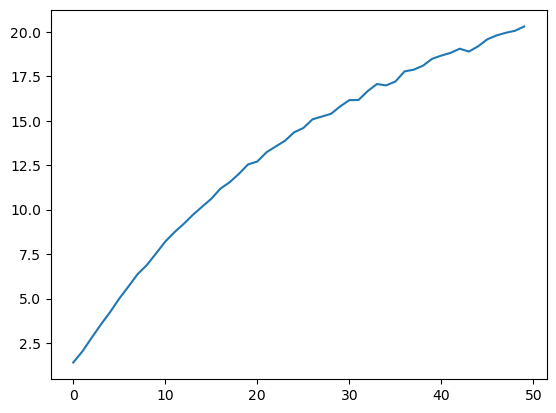

In [476]:
plt.plot([arr[i,i] for i in range(50)])
# plt.plot(arr[10])

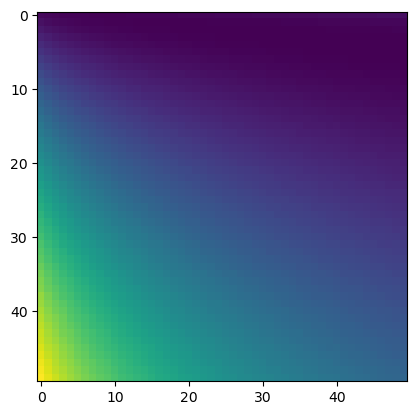

In [536]:
plt.imshow(arr)

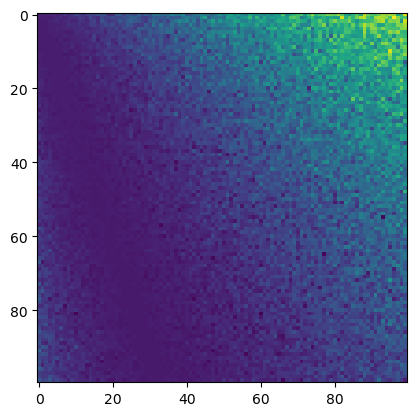

In [295]:
plt.imshow(arr)

In [268]:
-p*np.log((a+x)/(a+b+np.arange(1,n+1)))

array([[0.20492834, 0.19947143, 0.21679625, ..., 0.22091759, 0.22652022,
        0.18907953],
       [0.20550461, 0.22328698, 0.19484553, ..., 0.20992708, 0.22617639,
        0.22592314],
       [0.20879199, 0.22685882, 0.22088365, ..., 0.22014503, 0.20240488,
        0.22556916],
       ...,
       [0.22153611, 0.21563696, 0.23436582, ..., 0.21806412, 0.23960487,
        0.21350543],
       [0.22910952, 0.2230087 , 0.24237783, ..., 0.25134522, 0.22632935,
        0.24318755],
       [0.20882474, 0.18201368, 0.17729408, ..., 0.18406238, 0.1969412 ,
        0.19760208]])

In [234]:
(((a+x)/(a+b+np.arange(1,n+1)))*p).shape

(100, 1000)

In [232]:
p=np.random.beta(a_0,b_0, size=(samples,1))

0.5

In [148]:
np.random.binomial(100,.5,10)

array([46, 53, 40, 50, 48, 55, 48, 47, 46, 56])

In [ ]:
n=1
p_hat=.5
x_ent_loss(p_hat, n, .75)

1.3862943611198908

In [9]:
p_hat=.1
n=1000
for k in np.linspace(-1,1,100):
    p_step = (1-p_hat)/k*np.log((n+np.exp(k))/(n+1))
    print(x_ent_loss(p_hat+p_step, np.exp(np.log(n)-k), (n*p_hat+1)/(n+1)), p_step, np.exp(np.log(n)-k))

0.32723921489028474 0.0005685196886662839 2718.2818284590444
0.3272429587210075 0.0005733482545965415 2663.9180223085978
0.3272467791903608 0.0005782365427349031 2610.641455674015
0.3272506778631392 0.0005831854151815446 2558.4303844971023
0.3272546563360468 0.0005881957475430318 2507.2634995861804
0.32725871623836156 0.0005932684291546698 2457.119917919055
0.3272628592325866 0.0005984043633060908 2407.9791741199183
0.32726708701513285 0.0006036044674707431 2359.8212121066917
0.3272714013170166 0.0006088696735394774 2312.6263769054403
0.3272758039045529 0.0006142009280584659 2266.375406628466
0.3272802965800876 0.0006195991924698595 2221.0494246128555
0.32728488118272026 0.000625065443358139 2176.6299317162475
0.3272895595890626 0.0006306006726992873 2133.098798766666
0.32729433371400063 0.0006362058881151035 2090.4382591633657
0.3272992055114745 0.0006418821131310495 2048.63090162566
0.32730417697527514 0.0006476303874392276 2007.6596630867455
0.3273092501398569 0.0006534517671653743 

1 0.5
(-0.8224670334241133, -1.0)
5.1806683178971165 0.6224593312018546
(-0.07046243557798992, -0.25992830824793917)
5.964701056331285 0.6524813342047578
(-0.05357365708975759, -0.22005408131272491)
6.639298114036611 0.676993930776416
(-0.04332624067064339, -0.1933578313848329)
7.240271701500313 0.6977634396485587
(-0.0364202521702397, -0.17392029289718158)
7.787339219002816 0.7157812177657293
(-0.03144679572277442, -0.15898725456914053)
8.292842798071433 0.7316723280393637
(-0.027695954423038183, -0.14707361904532382)
8.765159697860843 0.745861530631244
(-0.02476909145433659, -0.13729744070909944)
9.210304587091278 0.7586531196870598
(-0.02242439154590925, -0.12909756597530855)
9.632778447228768 0.7702738576904191
(-0.020506381201918833, -0.12209786690459887)
10.036058590913756 0.7808979941513833
(-0.01891043968760764, -0.11603571835038948)
10.42290038973562 0.790662759881719
(-0.017563531611169525, -0.11072159318597895)
10.795532694492929 0.7996784343689387
(-0.016413103067903112, -0

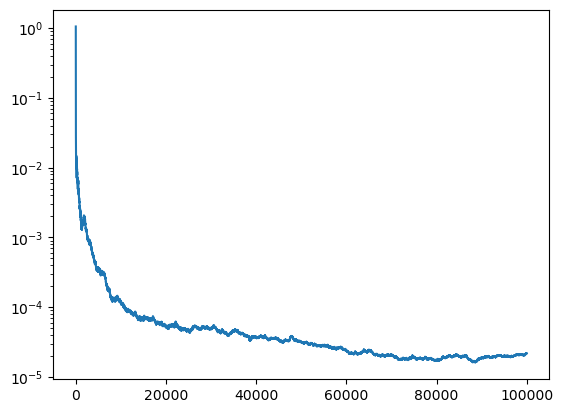

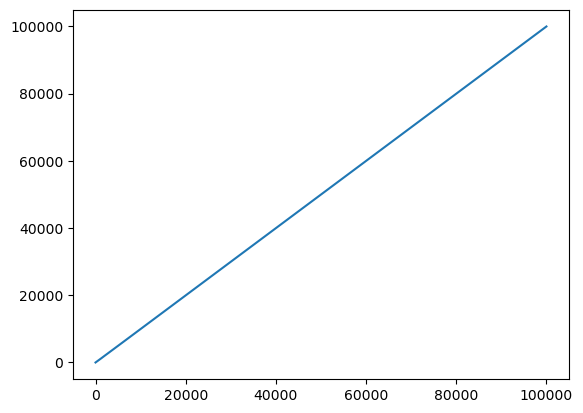

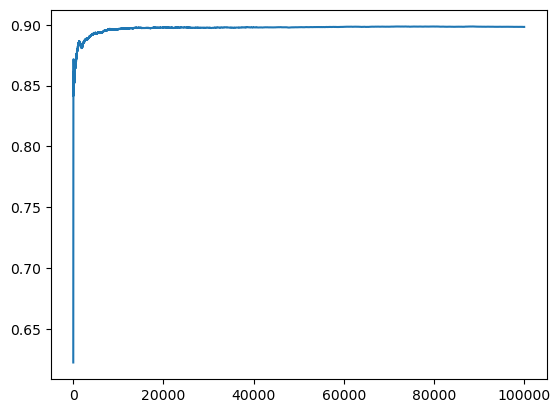

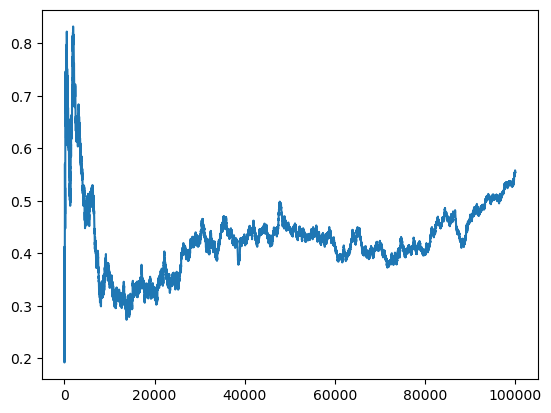

In [471]:
p=.9
n, p_hat = 1, .5
n_list = []
p_hat_list = []
vals_list = []
np.random.seed(1)
for i in range(100000):
    # if i > 5000:
    #     p=.1
    observation = np.random.binomial(1,p)
    target_p = (n*p_hat + observation*100)/(n+100)
    grad, _, _ = delta_np_xent(n, p_hat, target_p, observation)
    _, val, kl = delta_np_xent(n, p_hat, p, observation)
    print(n,p_hat)
    print(grad)
    n = np.exp(np.log(n) - 2*grad[0])
    p_hat = 1/(1+np.exp(-(np.log(p_hat/(1-p_hat)) - .5*grad[1])))
    # print(p_hat)
    n_list.append(n)
    p_hat_list.append(p_hat)
    vals_list.append(val)
print(np.array(vals_list).mean())
plt.plot(vals_list)
plt.yscale('log')
plt.show()
plt.plot(n_list)
plt.show()
plt.plot(p_hat_list)
plt.show()
plt.plot(np.abs(np.array(p_hat_list)-.9)*np.sqrt(np.arange(len(p_hat_list))+1))

    

Text(0, 0.5, 'beta')

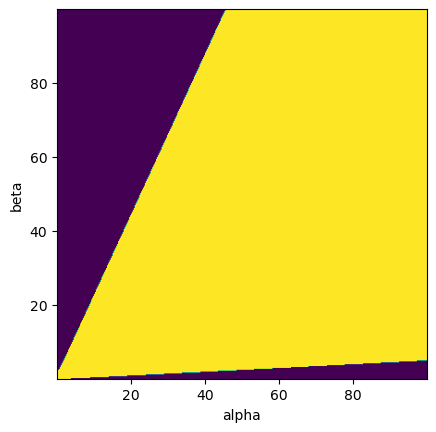

In [ ]:
eta = .95
snap = True
p=.9
grid = np.zeros((400, 400))
a_vals = np.array(range(len(grid[0])))/4+.1
b_vals = np.array(range(len(grid)))/4+.1
for i in range(len(grid[0])):
    a = a_vals[i]
    for j in range(len(grid)):
        b = b_vals[j]
        grad, val, kl = delta_e_xent(a,b,(a+p)/(a+b+1))
        a_change = np.exp(np.log(a)-grad[0]*eta)-a
        b_change = np.exp(np.log(b)-grad[1]*eta)-b
        if snap:
            grid[j,i] = 1 if a_change+b_change> 0 else 0
        else:
            grid[j,i] = a_change+b_change
plt.imshow(grid, origin='lower', extent = [min(a_vals),max(a_vals), min(b_vals), max(b_vals)])
plt.xlabel('alpha')
plt.ylabel('beta')

In [3]:
def fibsolver(d):
    x=1
    for i in range(10):
        t = (-x**(d+1)+x+1)/((d+1)*x**d-1)
        x+=t
    return x
phi_d_dict = {i:fibsolver(i) for i in range(1,10000)}

In [4]:
def simulated_lifetime_loss(alpha, alpha_0, n, samples):
    K=len(alpha_0)
    d=K+1
    step_vector = np.array(d*[1/phi_d_dict[d]])**np.arange(1,d+1)
    raw_randomness = (np.random.random(d)+step_vector*np.expand_dims(np.arange(1,samples+1),-1))%1

    gamma_vars = scipy.stats.gamma.ppf(raw_randomness[:,:K],alpha_0)
    dirichlet_vars = (gamma_vars.transpose()/gamma_vars.sum()).transpose()
    n_vars = (raw_randomness[:,-1]*n-.5).round()
    dist = numpyro.distributions.Multinomial(n_vars, dirichlet_vars)
    x = torch.tensor(np.array(dist.sample(jax.random.PRNGKey(0))))
    dirichlet_vars = torch.tensor(dirichlet_vars)
    return (-dirichlet_vars*torch.log((x+alpha)/(x+alpha).sum(axis=-1).unsqueeze(-1))).sum(axis=-1).sum(axis=0).mean()

In [595]:
simulated_lifetime_loss(torch.tensor([1,2]), torch.tensor([6,5]), 100,100)

tensor(0.6635, dtype=torch.float64)

In [5]:
def trapezoid_integration(x_dist,y_dist, definite=True):
    if definite:
        return np.diff(x_dist).dot((y_dist[:-1]+y_dist[1:])/2)
    else:
        return np.insert(np.cumsum(np.diff(x_dist)*((y_dist[:-1]+y_dist[1:])/2)), 0, 0)

In [6]:
def grad_modifier(a,b):
    epsilon = .000001
    x=np.arange(.001,1,.001)
    inv_beta_cdf_a_movement = (scipy.special.logit(scipy.special.betaincinv(a+epsilon,b,x))-scipy.special.logit(scipy.special.betaincinv(a,b,x)))/epsilon
    inv_beta_cdf_b_movement = (scipy.special.logit(scipy.special.betaincinv(a,b+epsilon,x))-scipy.special.logit(scipy.special.betaincinv(a,b,x)))/epsilon

    a2_int = trapezoid_integration(x,inv_beta_cdf_a_movement**2)
    b2_int = trapezoid_integration(x,inv_beta_cdf_b_movement**2)
    ab_int = trapezoid_integration(x,inv_beta_cdf_a_movement*inv_beta_cdf_b_movement)
    hessian = np.array([[a2_int, ab_int],[ab_int,b2_int]])
    # eigenvalues, eigenvectors = np.linalg.eig(hessian)
    # easiest_direction = eigenvectors[:,np.argmin(eigenvalues)]
    # slope = easiest_direction[1]/easiest_direction[0]

    grad_modifier_matrix = scipy.linalg.sqrtm(np.linalg.inv(hessian))
    return grad_modifier_matrix

In [7]:
def beta_dynamics(iterations=100000, p_known=False, prob_switch_test=False, seed=0, log_space=True, a = .5, b = .5, n=1, p_hat=.5, p=.9,
                  learning_rate=1, loss_fn='simple_posterior', observation_gain=100, np_param=False, grad_modification = False):
    np.random.seed(seed)
    vals = []
    kls = []
    a_list = []
    b_list = []
    n_list = []
    p_hat_list = []
    switched=False
    for i in range(iterations):
        if prob_switch_test and i > iterations /2 and not switched:
            p = 1-p
            switched=True
        if np_param:
            n_list.append(n)
            p_hat_list.append(p_hat)
        else:
            a_list.append(a)
            b_list.append(b)
        if p_known:
            grad, val, kl = delta_e_xent(a,b,p)
        else:
            observation = np.random.binomial(1,p)
            if loss_fn == 'simulated_lifetime_loss':
                alpha_0 = torch.tensor([a,b])
                alpha_0[observation] +=1
                print(alpha_0)
                grad, _, _ = simulated_lifetime_loss(torch.tensor([a,b]), alpha_0, 100, 100)
            if loss_fn == 'square_root_weighting':
                grad, _, _ = delta_e_xent(a,b,(a+observation*(a+b)**.5)/(a+b+(a+b)**.5))
            if loss_fn == 'simple_posterior':
                grad, _, _ = delta_e_xent(a,b,(a+observation)/(a+b+1))
            if loss_fn == 'exaggerated_posterior':
                grad, _, _ = delta_e_xent(a,b,(a+observation*observation_gain)/(a+b+observation_gain))
            if loss_fn == 'observation_target':
                grad, _, _ = delta_e_xent(a,b,observation)
            if loss_fn == 'nonrandom_observations':
                grad, _, _ = delta_e_xent(a,b,(a+p)/(a+b+1))
            if loss_fn == 'fit_p':
                grad, _, _ = delta_e_xent(a,b,p) # no observations, just fitting
            _, val, kl = delta_e_xent(a,b,p)
        vals.append(val)
        kls.append(kl)
        # print(grad)
        # print(round(a,4),round(b,4), round(a/(a+b),4), round(val, 8), round(kl,4))
        if log_space:
            a=np.exp(np.log(a)-grad[0]*learning_rate)
            b=np.exp(np.log(b)-grad[1]*learning_rate)
        if grad_modification:
            try:
                a,b = np.array([a,b]) - grad_modifier(a,b).dot(np.array([a,b]))*learning_rate
            except:
                print(a,b)
        else:
            a-=grad[0]*learning_rate
            b-=grad[1]*learning_rate
    return vals, kls, a_list, b_list

0.28698437867345755
0.1255361268257181


Text(0, 0.5, 'Posterior Probability')

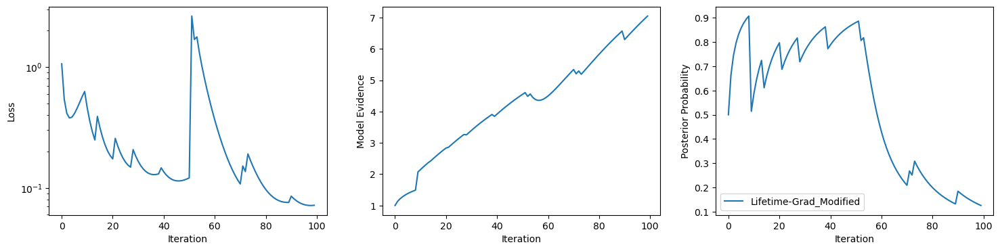

In [11]:
global_args = {'iterations': 100, 'prob_switch_test': True}
num_seeds = 1
runs = [
    # {'name': 'Simple Posterior', 'args': {}}, 
    # {'name': 'Nonrandom', 'args': {'loss_fn':'nonrandom_observations'}}, 
    # {'name': 'Observation Target', 'args': {'loss_fn':'observation_target', 'learning_rate': .05}},
    # {'name': 'Exaggerated Posterior', 'args': {'loss_fn':'exaggerated_posterior'}}, # best on 100000
    {'name': 'Lifetime-Grad_Modified', 'args': {'loss_fn':'exaggerated_posterior', 'learning_rate': .1, 'grad_modification':False}}, # best on 100000
    # {'name': 'Exaggerated Posterior', 'args': {'loss_fn':'exaggerated_posterior', 'observation_gain': 99, 'learning_rate': 1}}, # best on 100000
    # {'name': 'Exaggerated Posterior Small', 'args': {'loss_fn':'exaggerated_posterior', 'observation_gain': 8, 'learning_rate': 1.3}}, # best on 10000
    # {'name': 'Exaggerated Posterior Small', 'args': {'loss_fn':'exaggerated_posterior', 'observation_gain': 7.1, 'learning_rate': 1.33}}, # best on 1000
    # {'name': 'Square Root Weighting', 'args': {'loss_fn':'square_root_weighting'}},
    ]
fig = plt.figure(figsize=(18,4))
for run in runs:
    name = run['name']
    val_list = []
    a_lists = []
    b_lists = []
    for seed in range(num_seeds):
        vals, kls, a_list, b_list = beta_dynamics(**{**run['args'], **global_args, **{'seed':seed}})
        val_list.append(vals)
        a_lists.append(a_list)
        b_lists.append(b_list)
    vals = np.array(val_list).mean(axis=0)
    a_list, b_list = np.array(a_lists), np.array(b_lists)
    evidences = a_list+b_list
    probs = a_list/(a_list+b_list)
    print(vals.mean())
    print(np.median(probs, axis=0)[-1])
    plt.subplot(1,3,1)
    plt.plot(range(global_args['iterations']), vals, label=name)
    plt.subplot(1,3,2)
    plt.plot(range(global_args['iterations']), np.median(evidences, axis=0), label=name)
    plt.subplot(1,3,3)
    plt.plot(range(global_args['iterations']), np.median(probs, axis=0), label=name)
plt.legend()
plt.subplot(1,3,1)
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.subplot(1,3,2)
plt.xlabel('Iteration')
plt.ylabel('Model Evidence')
plt.subplot(1,3,3)
plt.xlabel('Iteration')
plt.ylabel('Posterior Probability')

In [569]:
a_list

array([[  0.5       ,   2.55857351,   2.86383168, ..., 290.27753528,
        288.83739691, 287.42288521],
       [  0.5       ,   2.55857351,   2.86383168, ..., 234.91676519,
        234.25284387, 233.59612785],
       [  0.5       ,   2.55857351,   2.86383168, ..., 240.63323704,
        240.01696538, 239.406795  ],
       ...,
       [  0.5       ,   2.55857351,   2.86383168, ..., 272.58060528,
        271.4519013 , 270.34035008],
       [  0.5       ,   2.55857351,   0.87400005, ..., 242.75721028,
        241.91654978, 241.08684582],
       [  0.5       ,   2.55857351,   2.86383168, ..., 306.32554778,
        304.6071348 , 302.92269277]])

In [570]:
b_list

array([[5.00000000e-01, 2.22400113e-01, 2.04153149e-01, ...,
        2.02203736e+03, 2.03254371e+03, 2.04297163e+03],
       [5.00000000e-01, 2.22400113e-01, 2.04153149e-01, ...,
        2.50451900e+03, 2.51206193e+03, 2.51956901e+03],
       [5.00000000e-01, 2.22400113e-01, 2.04153149e-01, ...,
        2.67168536e+03, 2.67899199e+03, 2.68626685e+03],
       ...,
       [5.00000000e-01, 2.22400113e-01, 2.04153149e-01, ...,
        2.17683366e+03, 2.18631661e+03, 2.19573807e+03],
       [5.00000000e-01, 2.22400113e-01, 2.11540942e+01, ...,
        2.27738234e+03, 2.28573499e+03, 2.29404044e+03],
       [5.00000000e-01, 2.22400113e-01, 2.04153149e-01, ...,
        1.92950753e+03, 1.94081163e+03, 1.95202338e+03]])

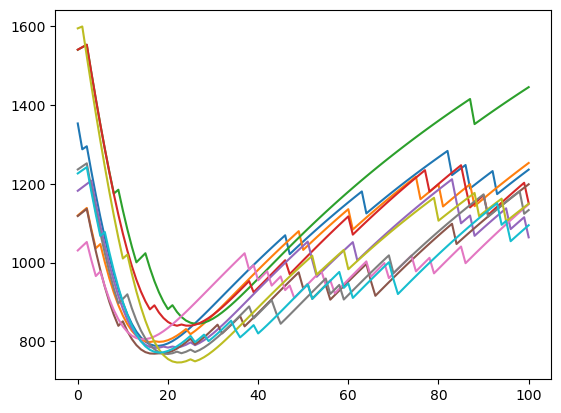

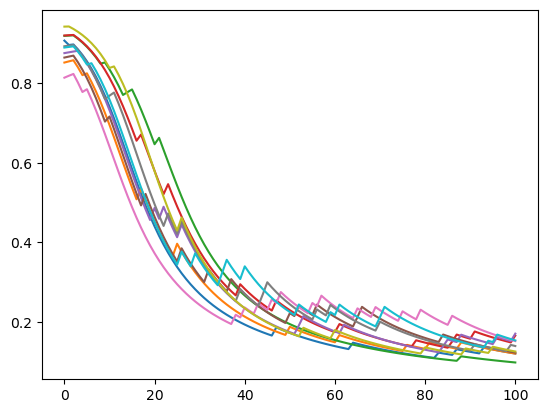

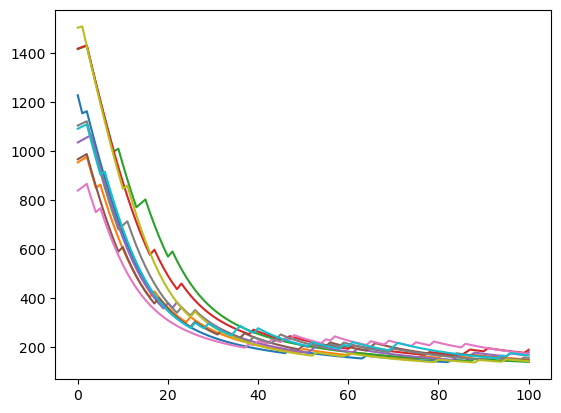

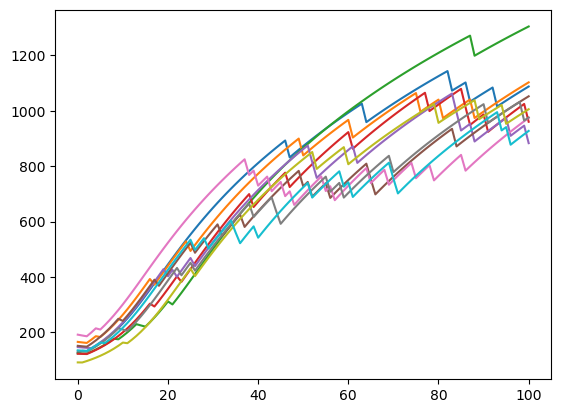

In [573]:
plt.plot(evidences[:,4999:5100].transpose())
plt.show()
plt.plot(probs[:,4999:5100].transpose())
plt.show()
plt.plot(a_list[:,4999:5100].transpose())
plt.show()
plt.plot(b_list[:,4999:5100].transpose())
plt.show()

In [ ]:
runs = [{'name': 'normal', 'args': {}}]
for run in runs:
    vals, kls, a_list, b_list = beta_dynamics(**run['args'])
    vals_nonrandom, kls_nonrandom, a_list_nonrandom, b_list_nonrandom = beta_dynamics(loss_fn='nonrandom_observations')
    # vals_no_logspace, kls_no_logspace, a_list_no_logspace, b_list_no_logspace = beta_dynamics(log_space=False, learning_rate=.35)
    vals_exaggerated_posterior, kls_exaggerated_posterior, a_list_exaggerated_posterior, b_list_exaggerated_posterior = beta_dynamics(loss_fn='exaggerated_posterior')
    plt.plot(range(iterations), vals)
    plt.plot(range(iterations), vals_nonrandom)
    # plt.plot(range(iterations), vals_no_logspace)
    plt.plot(range(iterations), vals_exaggerated_posterior)
    plt.legend()
    plt.yscale('log')
    plt.xlabel('Iteration')
    plt.ylabel('Loss')
    plt.show()
    plt.plot(range(iterations), np.array(a_list)+np.array(b_list))
    plt.plot(range(iterations), np.array(a_list_nonrandom)+np.array(b_list_nonrandom))
    # plt.plot(range(iterations), np.array(a_list_no_logspace)+np.array(b_list_no_logspace))
    plt.plot(range(iterations), np.array(a_list_exaggerated_posterior)+np.array(b_list_exaggerated_posterior))
    plt.xlabel('Iteration')
    plt.ylabel('Model Evidence')
    plt.show()
    plt.plot(range(iterations), np.array(a_list)/(np.array(b_list)+np.array(a_list)))
    plt.plot(range(iterations), np.array(a_list_nonrandom)/(np.array(b_list_nonrandom)+np.array(a_list_nonrandom)))
    plt.plot(range(iterations), np.array(a_list_exaggerated_posterior)/(np.array(b_list_exaggerated_posterior)+np.array(a_list_exaggerated_posterior)))
    plt.xlabel('Iteration')
    plt.ylabel('Posterior Probability')

KeyboardInterrupt: 